#### Fork process creation method

Include the analysis script and setup the folders with raw data

In [1]:
from benchmarking.analysis.analyze_results import *

In [2]:
output_base_folder = Path("/iarai/home/ivan.svogor/storage-benchmarking-raw/referenced-experiments/")
s3_folder_filter="updated_lightning-no-reset/s3/*benchmark_e2e*"
scratch_folder_filter="updated_lightning-no-reset/scratch/*benchmark_e2e*"

#### Load raw data

In [3]:
# df_dataloader_s3 = extract_timelines(output_base_folder, folder_filter=s3_folder_filter)
df_dataloader_scratch = extract_timelines(output_base_folder, folder_filter=scratch_folder_filter)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 321/321 [00:01<00:00, 237.93it/s]


In [4]:
df_dataloader_s3 = extract_timelines(output_base_folder, folder_filter=s3_folder_filter)


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 321/321 [00:01<00:00, 210.60it/s]


In [5]:
# Show data (to check if loaded correctly)

# df_dataloader_s3.sort_values(["start_time_x"], ascending=False)
# df_dataloader_scratch.sort_values(["start_time_x"`], ascending=False)

In [6]:
# extract unique functions (for s3 and scratch, it's the same)
unique_functions_s3 = np.unique(df_dataloader_s3["item_x"])

# define colors for timelane items 
colors = {}
for i, color in zip(unique_functions_s3, ["red", "gold", "blue", "magenta", "aqua"]):
    colors[str(i)] = color
    
# define lanes (each lane is for a single function call (i.e. usage))
lanes={}
for i, lane in zip(unique_functions_s3, range(len(unique_functions_s3))):
    lanes[str(i)] = lane

# print to verify
print(f"Unique functions: {unique_functions_s3}")
print(f"Lanes: {lanes}")
    
# get the names of the runs for the iterators later on 
unique_runs_s3 = np.unique(df_dataloader_s3["run"])
unique_runs_scratch = np.unique(df_dataloader_scratch["run"])

Unique functions: ['batch' 'next_data' 'run_training_batch' 'training_batch_to_device']
Lanes: {'batch': 0, 'next_data': 1, 'run_training_batch': 2, 'training_batch_to_device': 3}


#### Timeline plots

Each line corresponds to a unique function call.

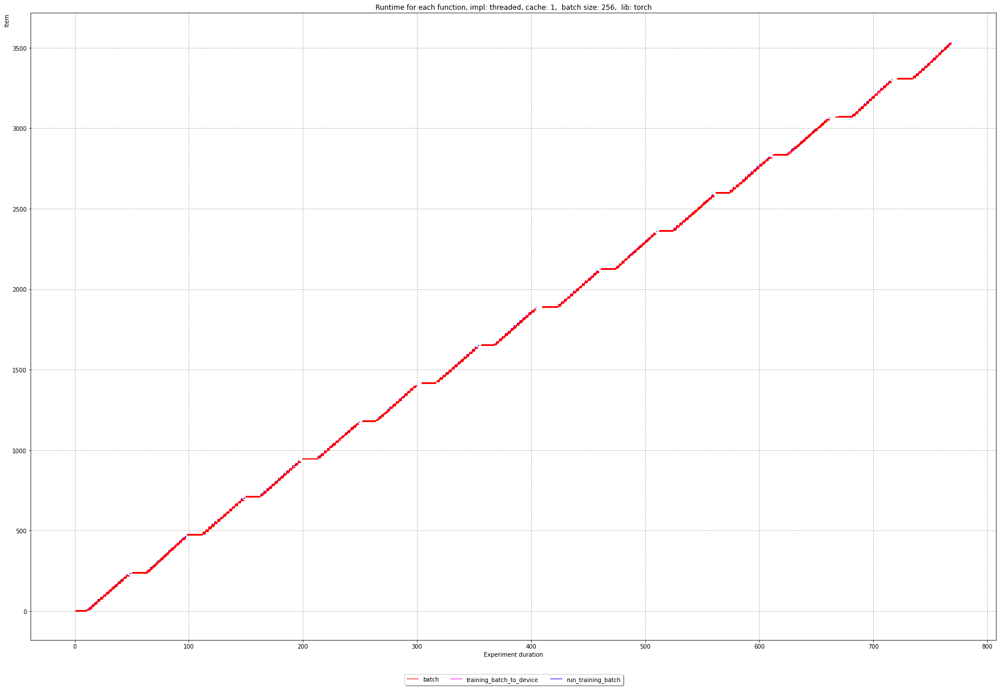

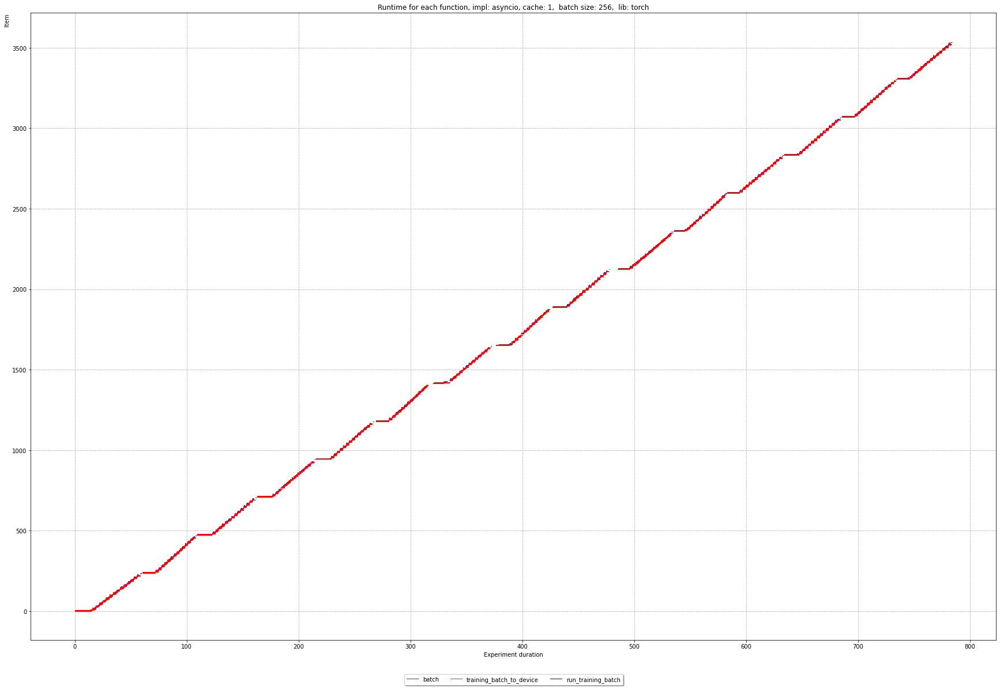

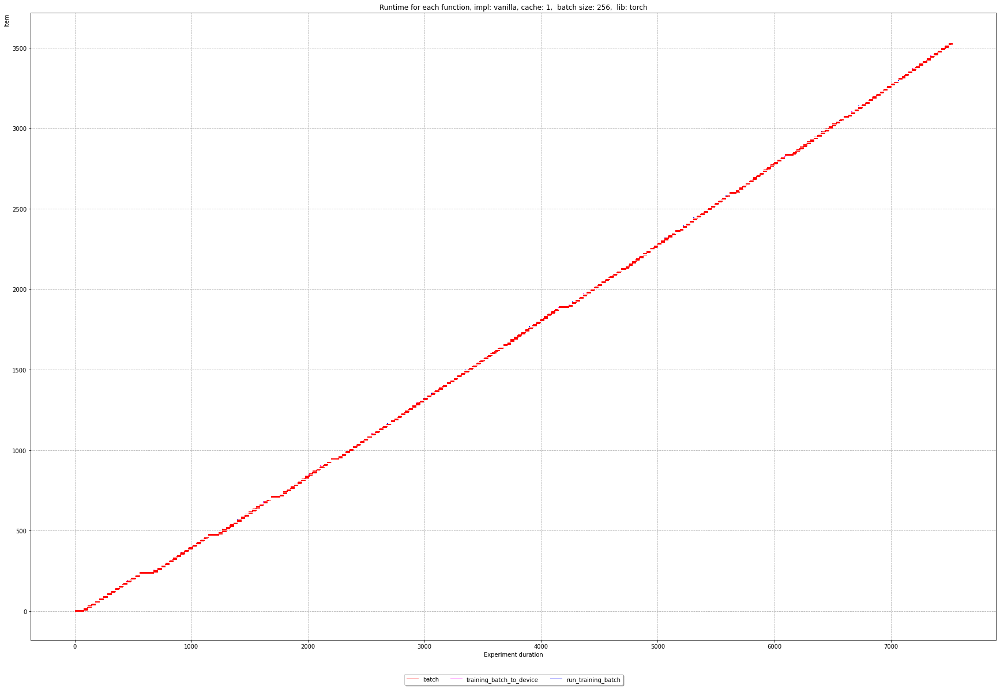

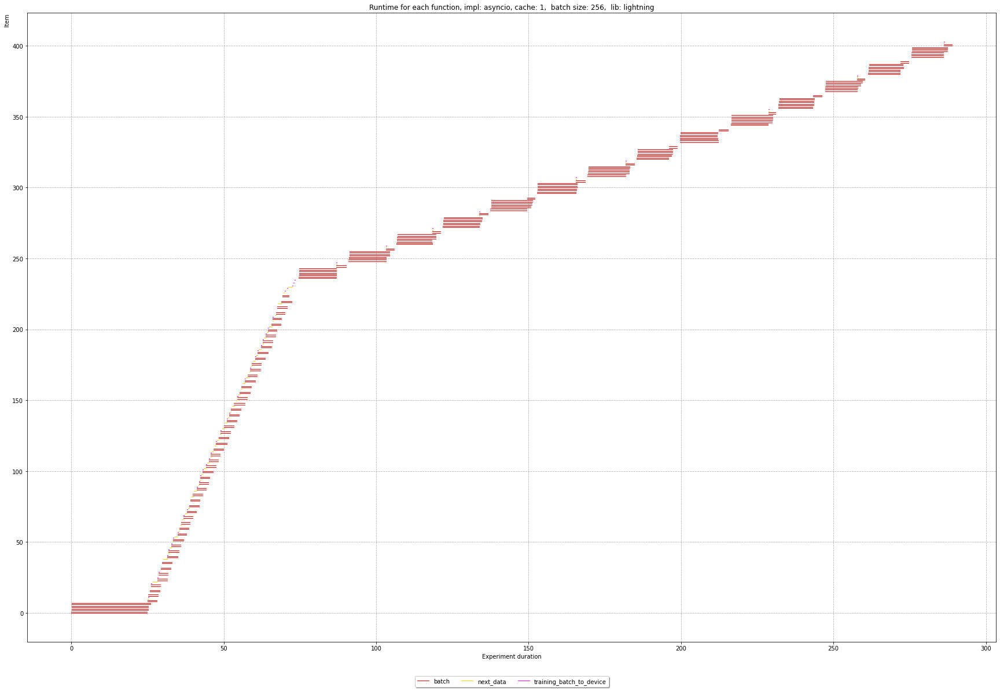

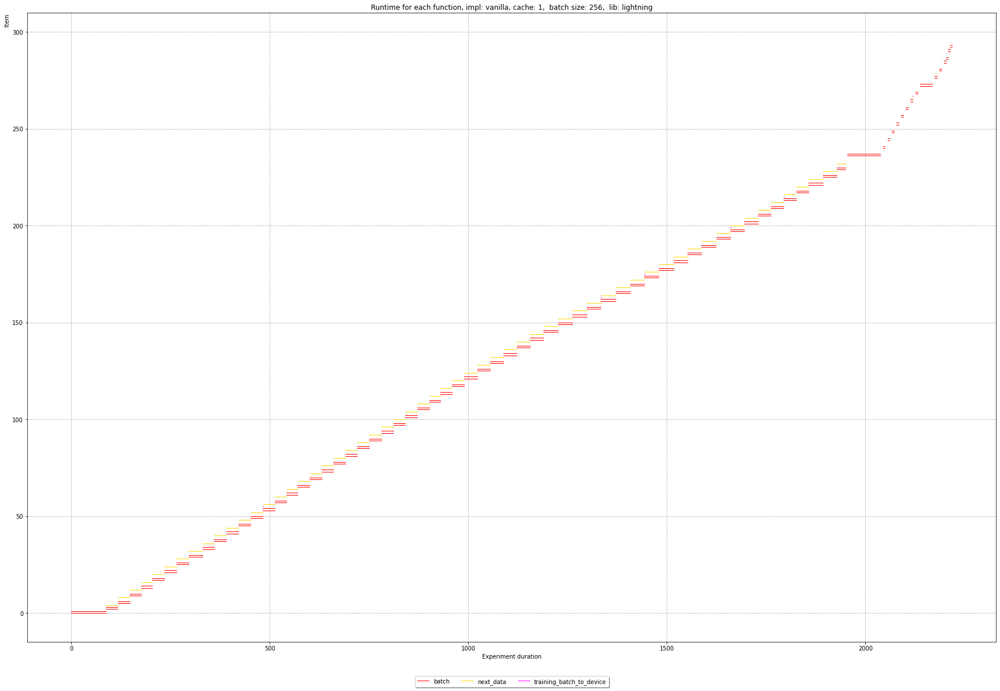

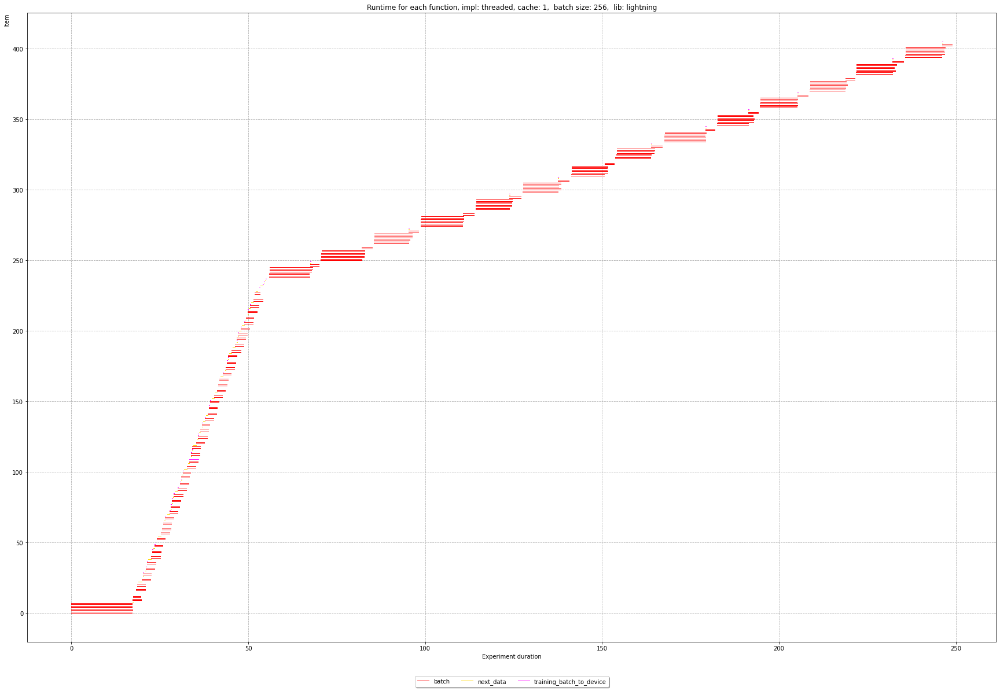

In [7]:
for implementation in ["torch", "lightning"]:
    for run in unique_runs_s3:
        if implementation in run:
            df = df_dataloader_s3[(df_dataloader_s3["run"]==run)]
            show_timelines(df, run, lanes, colors, False, False, 1)

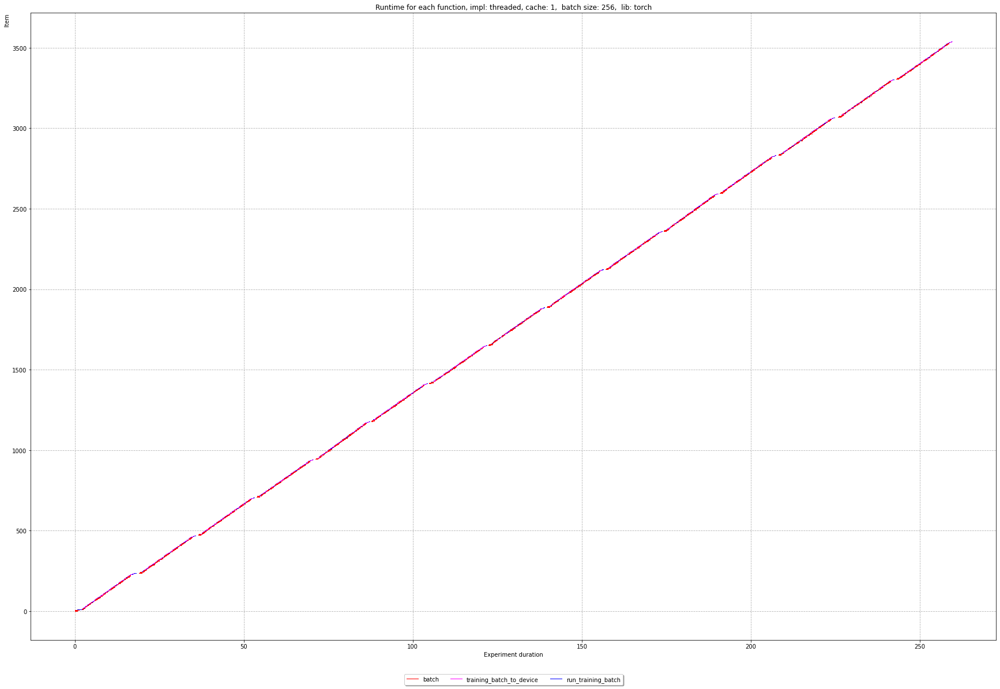

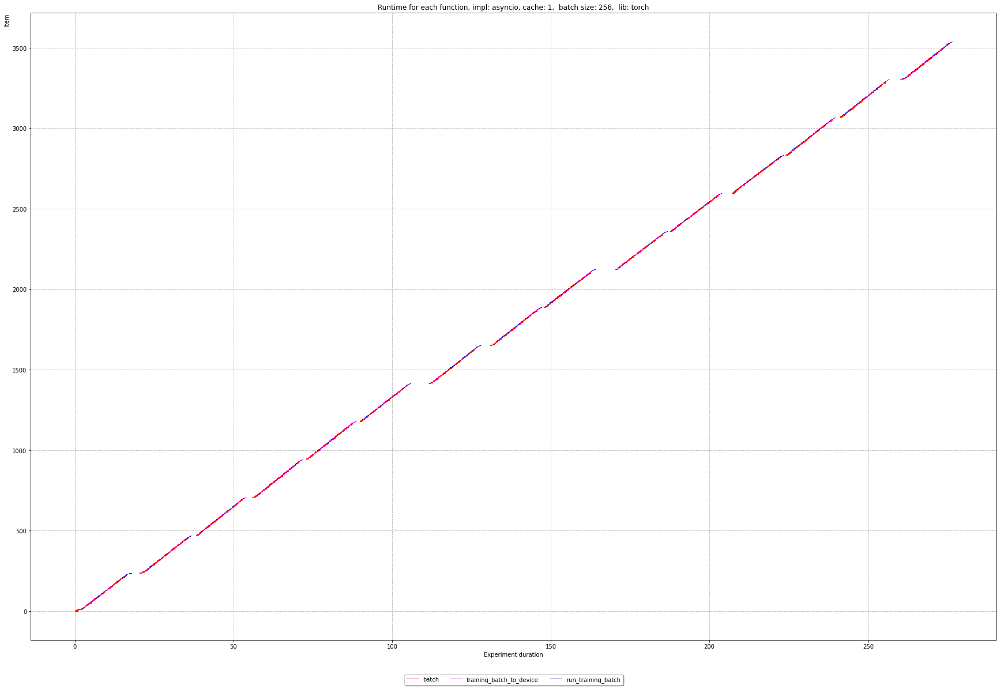

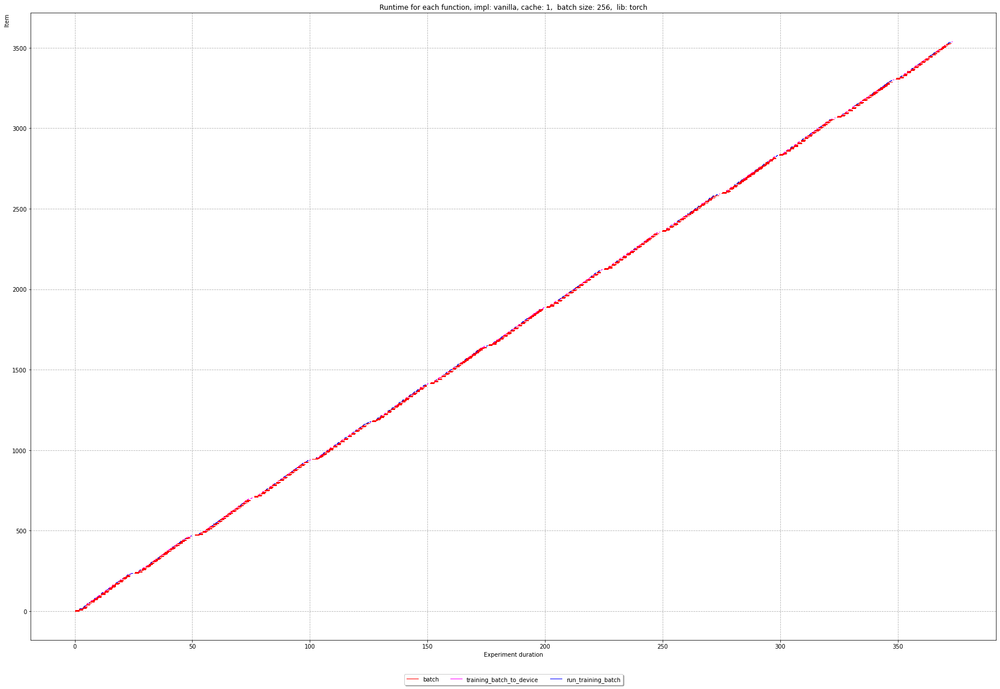

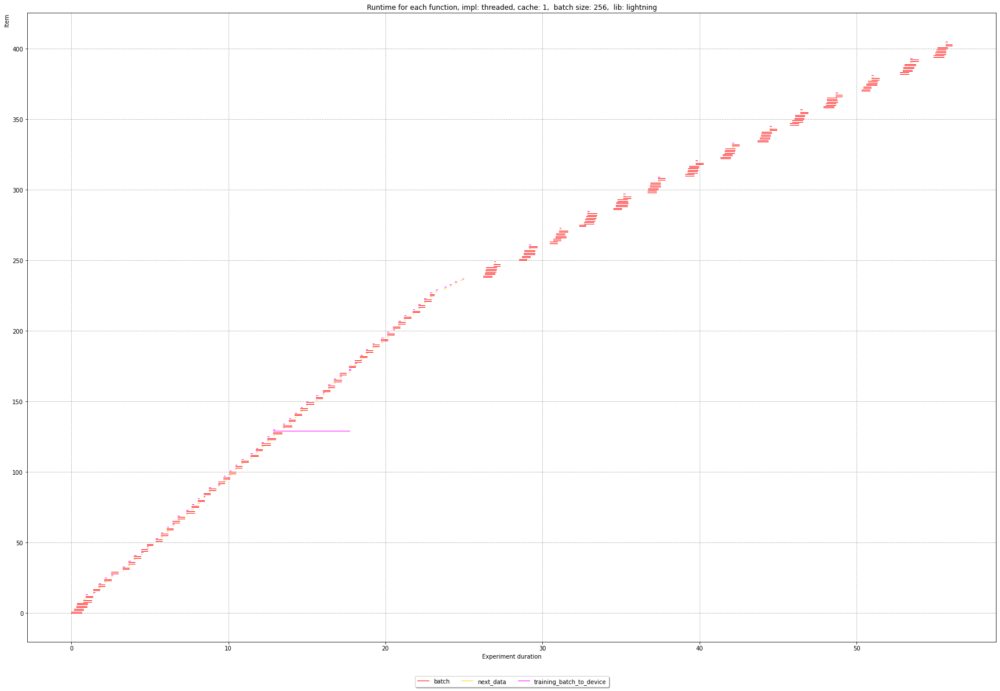

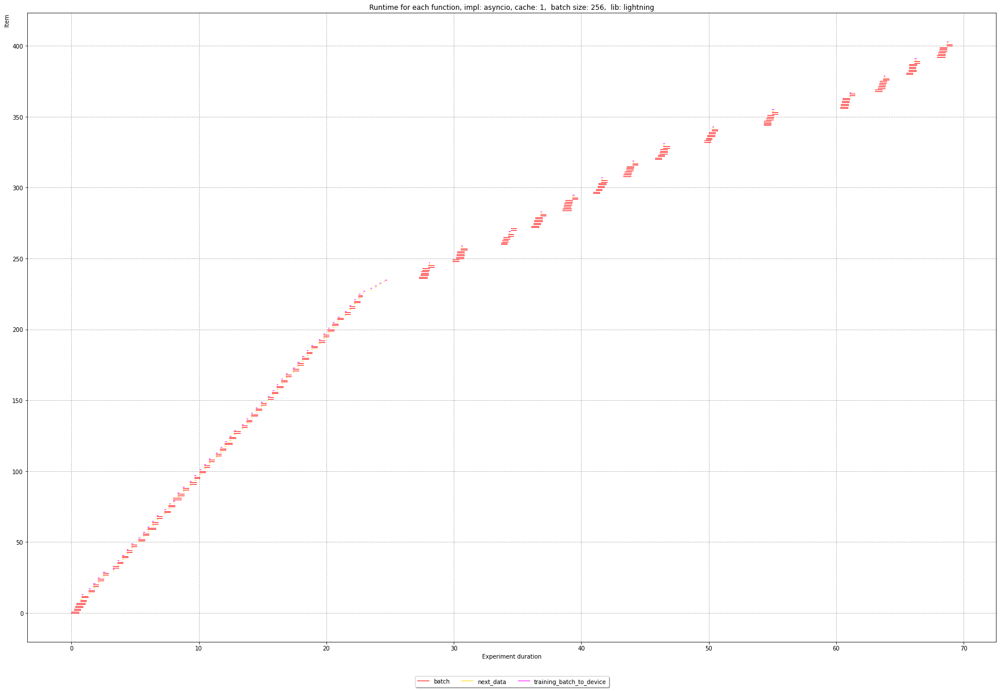

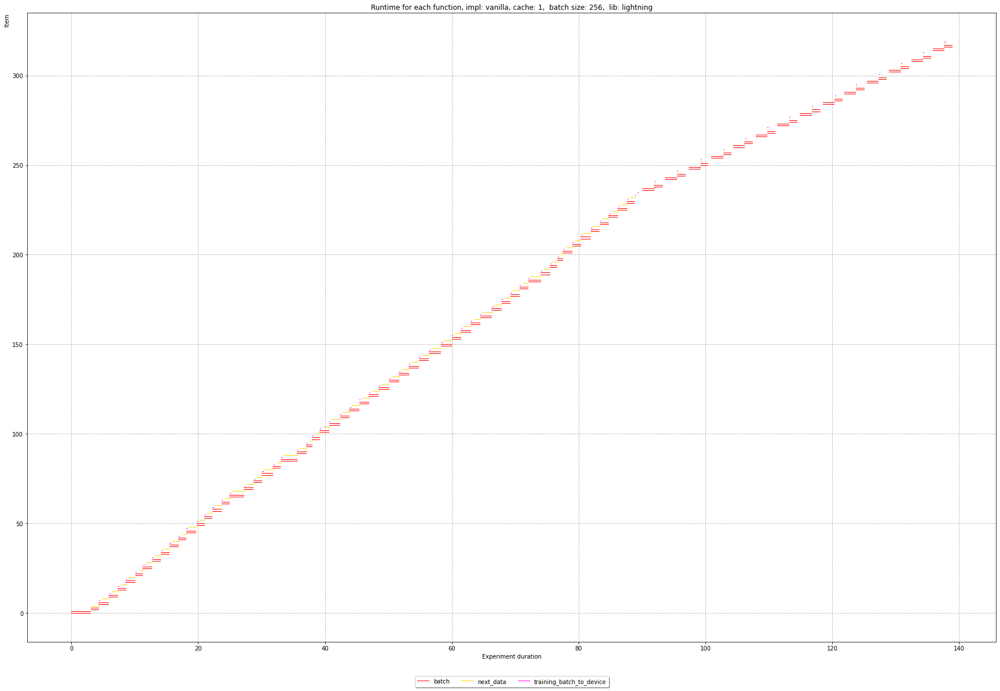

In [8]:
for implementation in ["torch", "lightning"]:
    for run in unique_runs_scratch:
        if implementation in run:
            df = df_dataloader_scratch[(df_dataloader_scratch["run"]==run)]
            show_timelines(df, run, lanes, colors, False, False, 1)

### GPU Utilization

In [9]:
# Load the GPU utilization 
df_gpuutil_s3 = extract_gpuutil(output_base_folder, folder_filter=s3_folder_filter)
df_gpuutil_scratch = extract_gpuutil(output_base_folder, folder_filter=scratch_folder_filter)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 321/321 [00:00<00:00, 10294.93it/s]


In [10]:
unique_runs_s3 = np.unique(df_dataloader_s3["run"])
unique_runs_scratch = np.unique(df_dataloader_scratch["run"])
print(unique_runs_s3, unique_runs_scratch)

['20220128f235206_benchmark_e2e_torch_s3_256_4_16_1_threaded_sync'
 '20220129f001223_benchmark_e2e_lightning_s3_256_4_16_1_asyncio_sync'
 '20220129f001723_benchmark_e2e_torch_s3_256_4_16_1_asyncio_sync'
 '20220129f003954_benchmark_e2e_lightning_s3_256_4_16_1_vanilla_sync'
 '20220129f011851_benchmark_e2e_torch_s3_256_4_16_1_vanilla_sync'
 '20220131f125947_benchmark_e2e_lightning_s3_256_4_16_1_threaded_sync'] ['20220129f000639_benchmark_e2e_lightning_scratch_256_4_16_1_threaded_sync'
 '20220129f000749_benchmark_e2e_torch_scratch_256_4_16_1_threaded_sync'
 '20220129f003332_benchmark_e2e_lightning_scratch_256_4_16_1_asyncio_sync'
 '20220129f003454_benchmark_e2e_torch_scratch_256_4_16_1_asyncio_sync'
 '20220129f032926_benchmark_e2e_lightning_scratch_256_4_16_1_vanilla_sync'
 '20220129f033157_benchmark_e2e_torch_scratch_256_4_16_1_vanilla_sync']


65.23821339950372 39.07161803713528


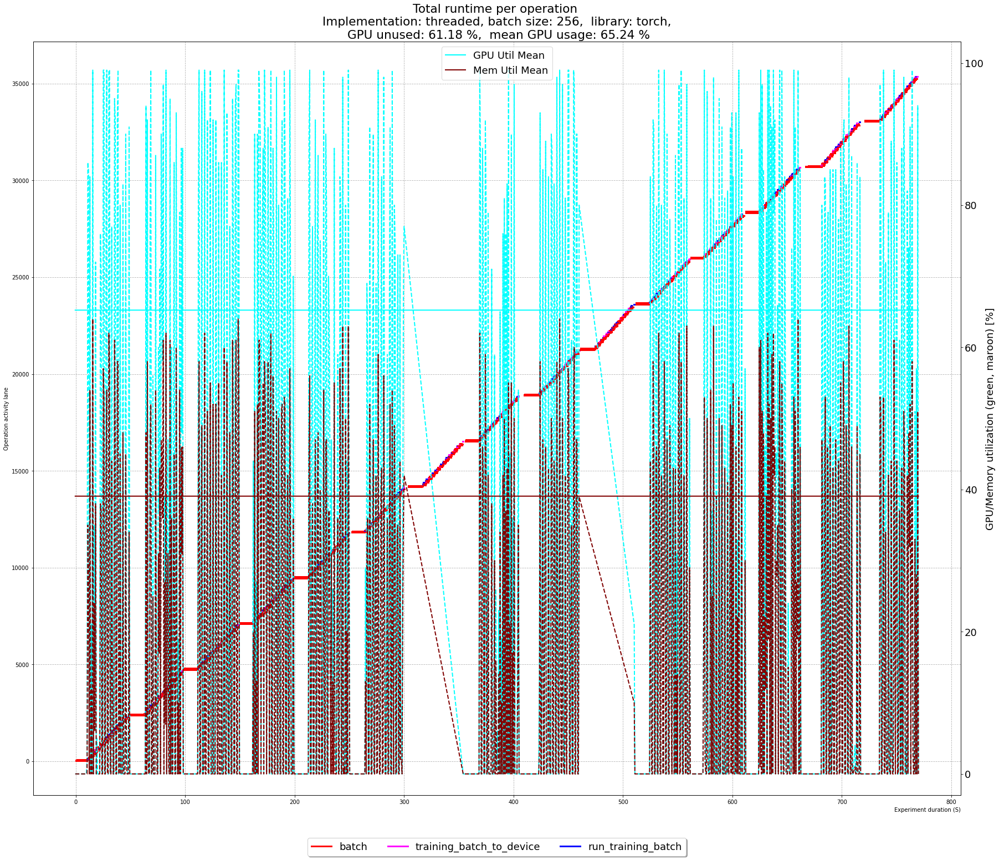

49.44285714285714 21.796296296296298


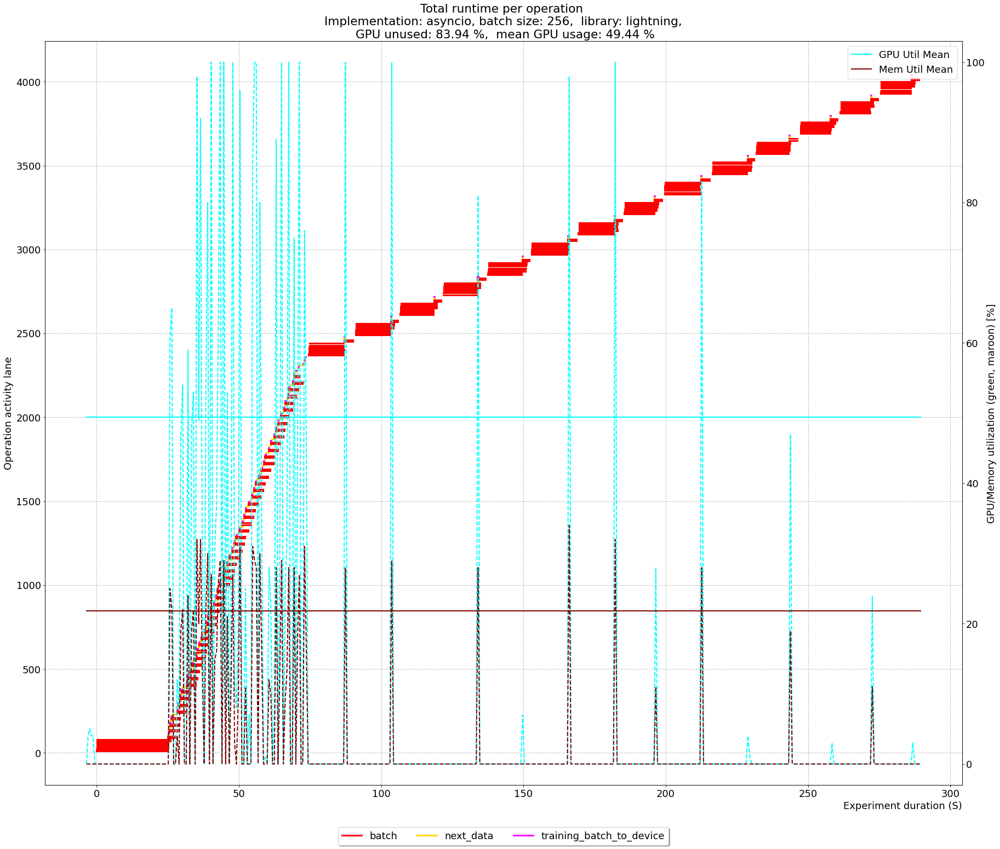

63.1482254697286 39.961451247165535


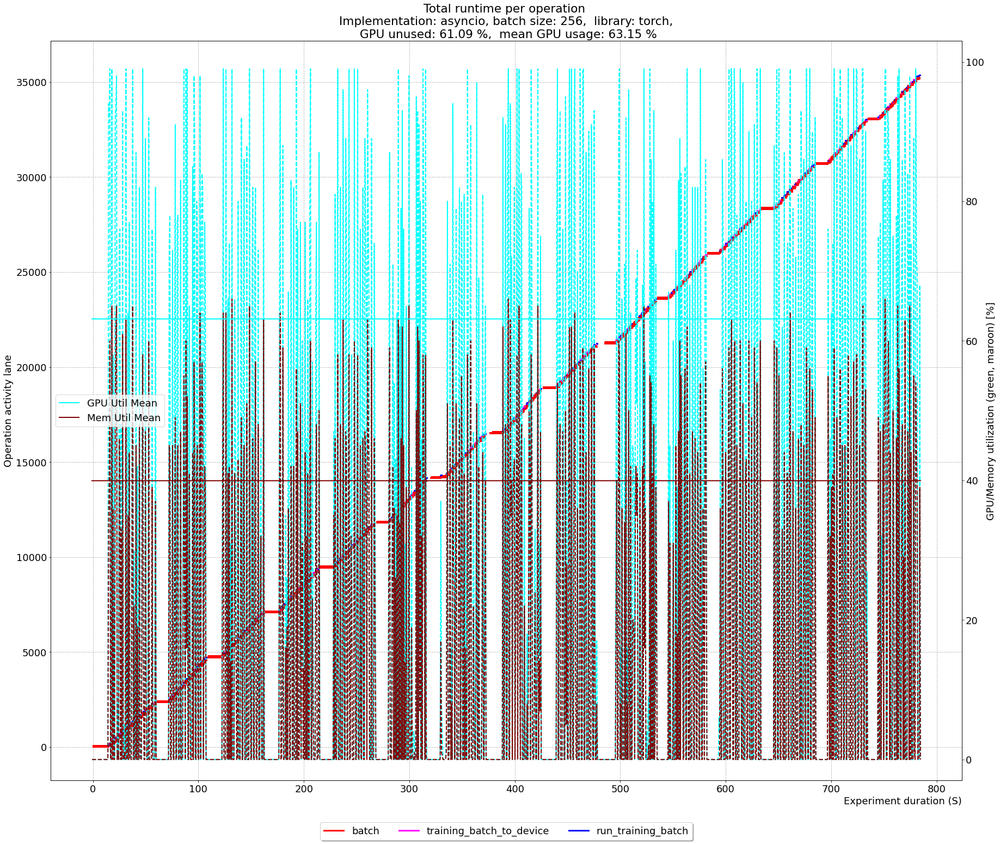

54.515151515151516 22.54901960784314


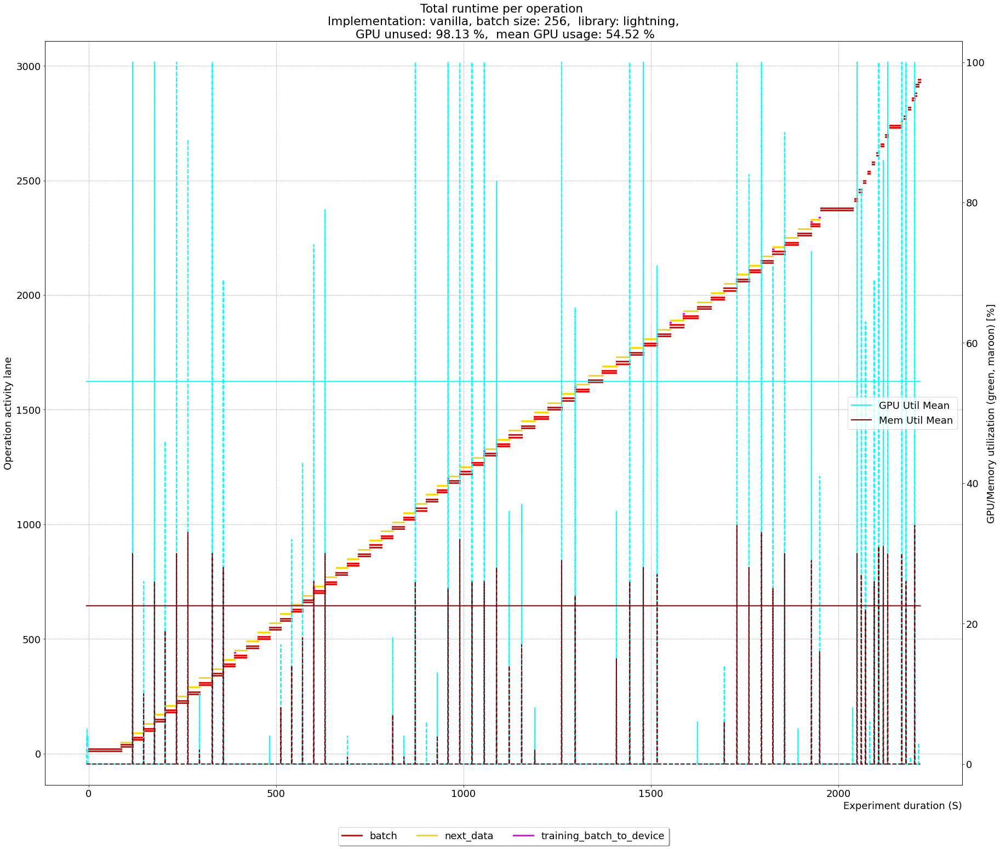

67.10706150341686 39.33414043583535


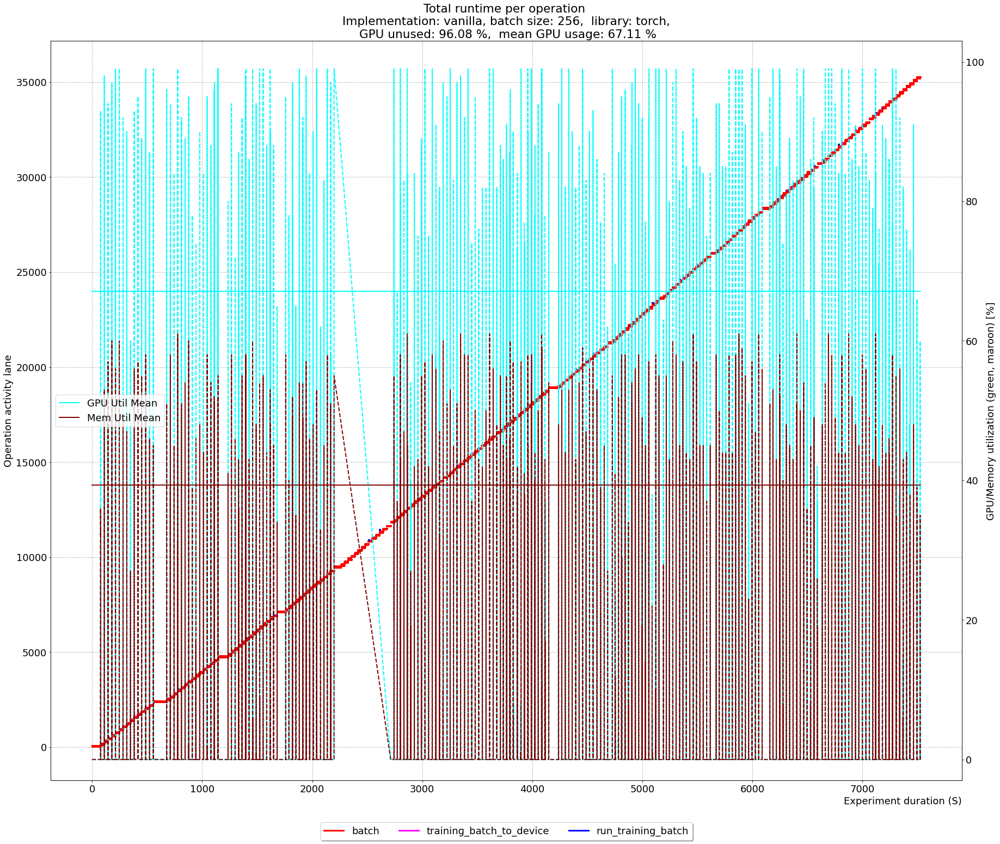

43.270270270270274 20.980392156862745


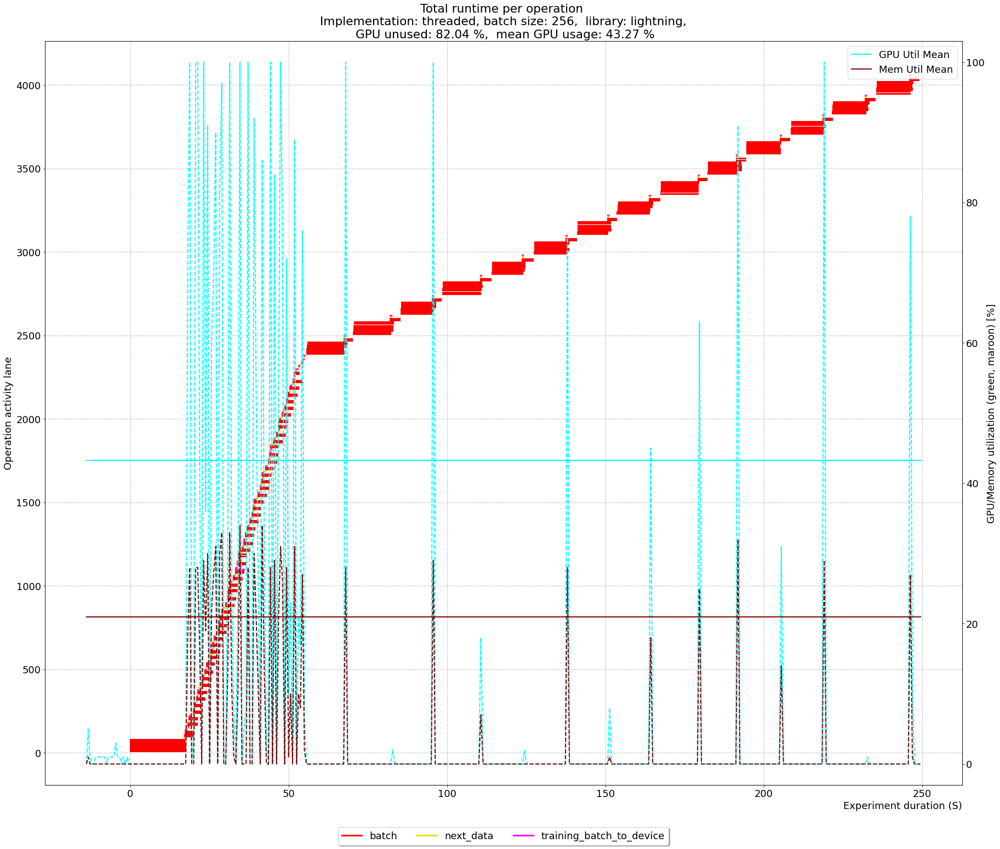

In [11]:
returns_s3 = []
for run in sorted(unique_runs_s3):
    df = df_dataloader_s3[df_dataloader_s3["run"]==run]
    dfgpu = df_gpuutil_s3[df_gpuutil_s3["run"]==run]
    returns_s3.append(show_timelines_with_gpu(df, dfgpu, lanes, colors, run, False, True, False, 2))

59.85454545454545 24.195652173913043


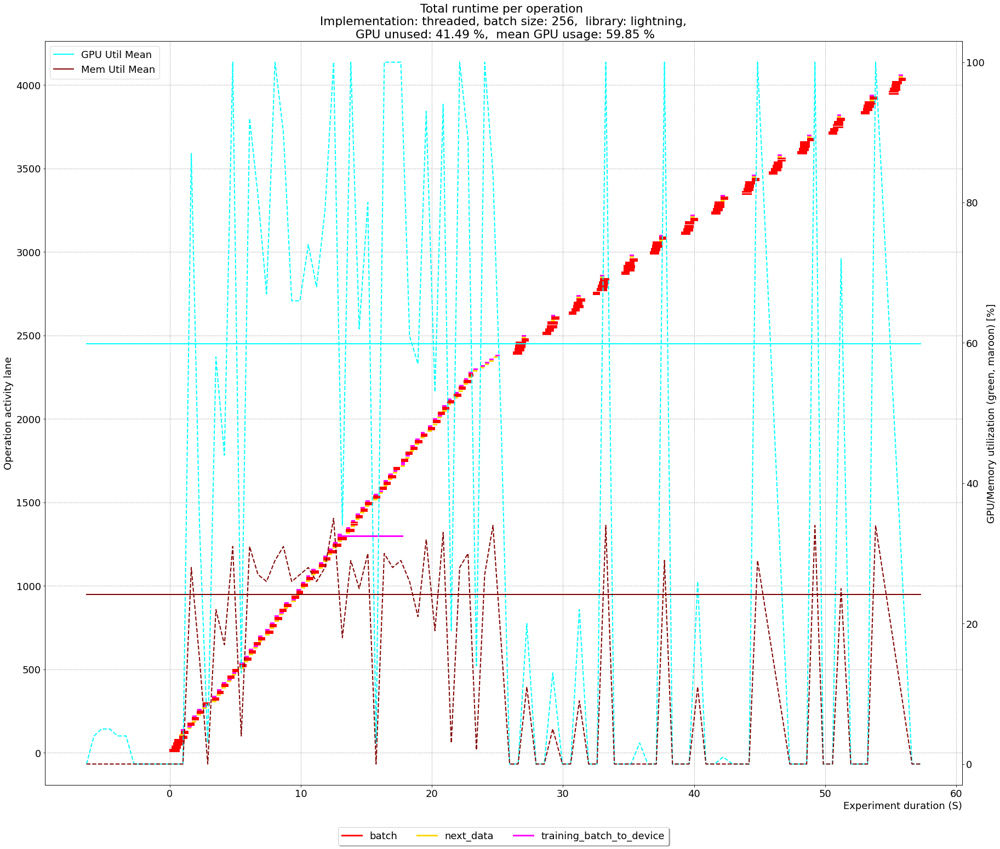

80.13030303030303 45.584848484848486


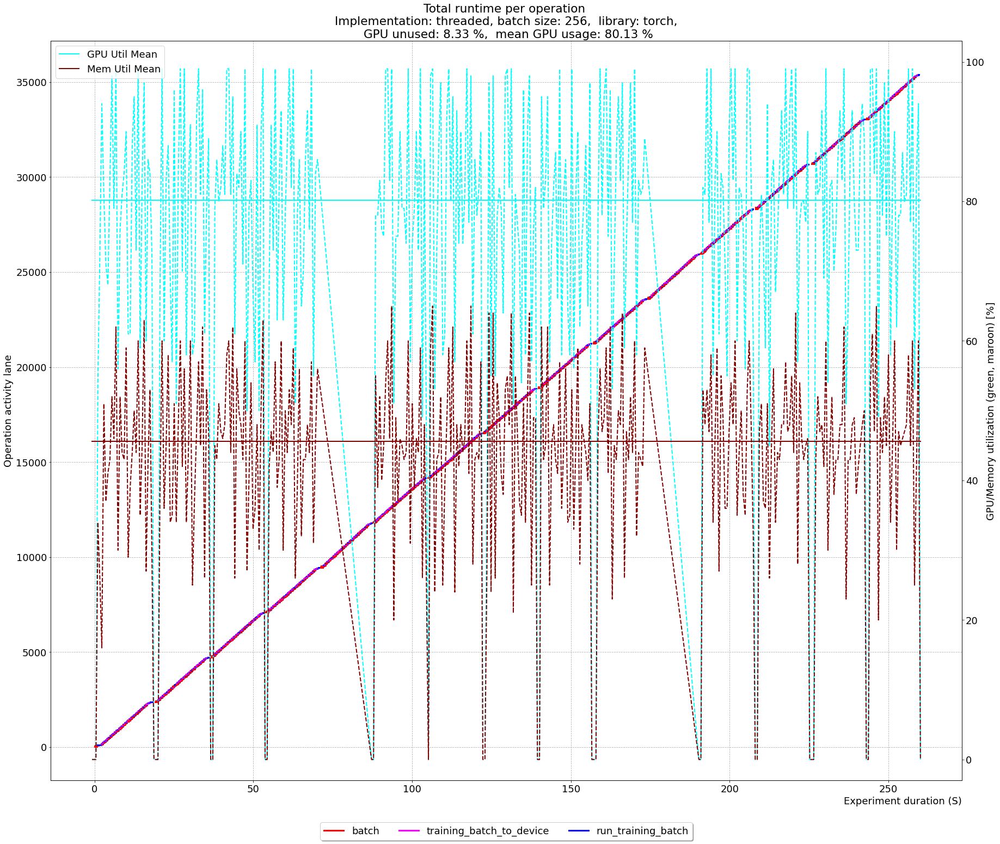

55.125 23.318181818181817


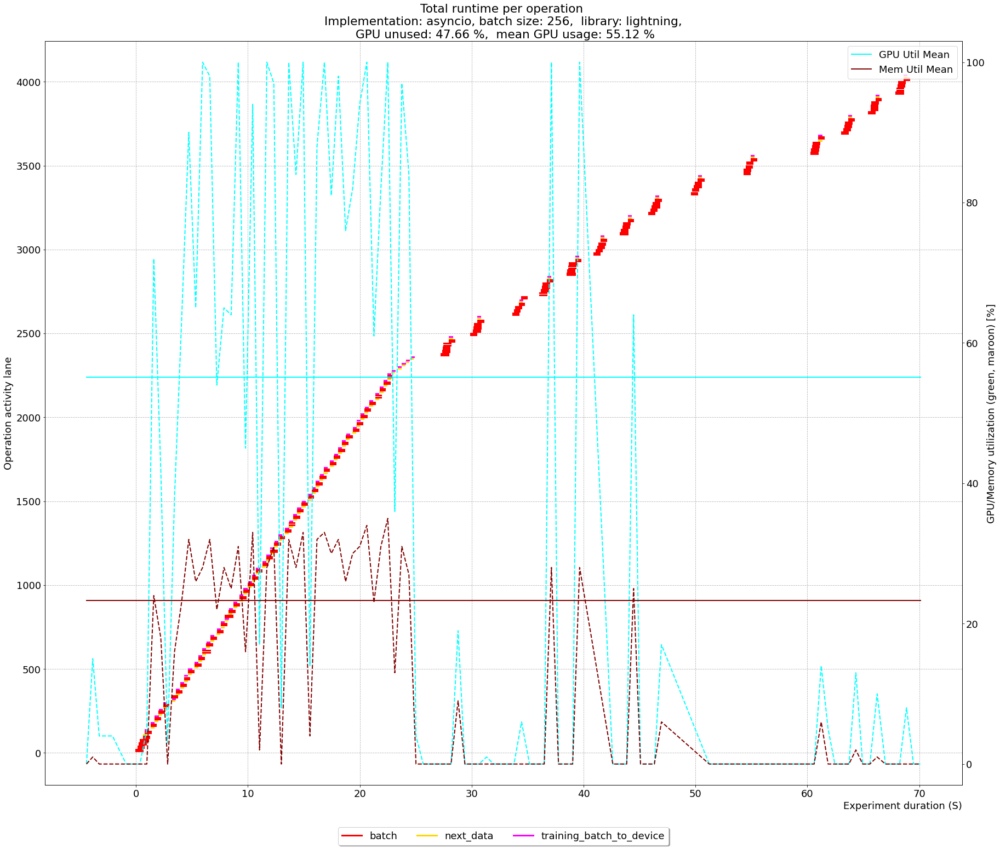

82.86575342465754 45.6831955922865


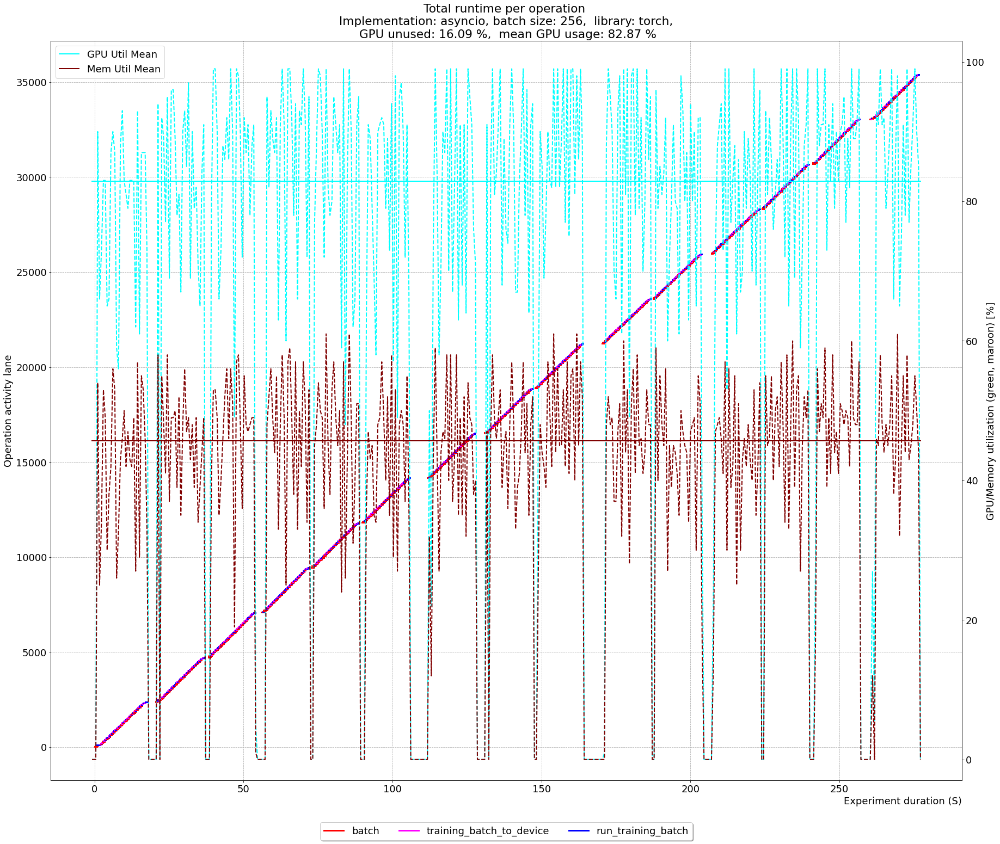

47.78125 20.632653061224488


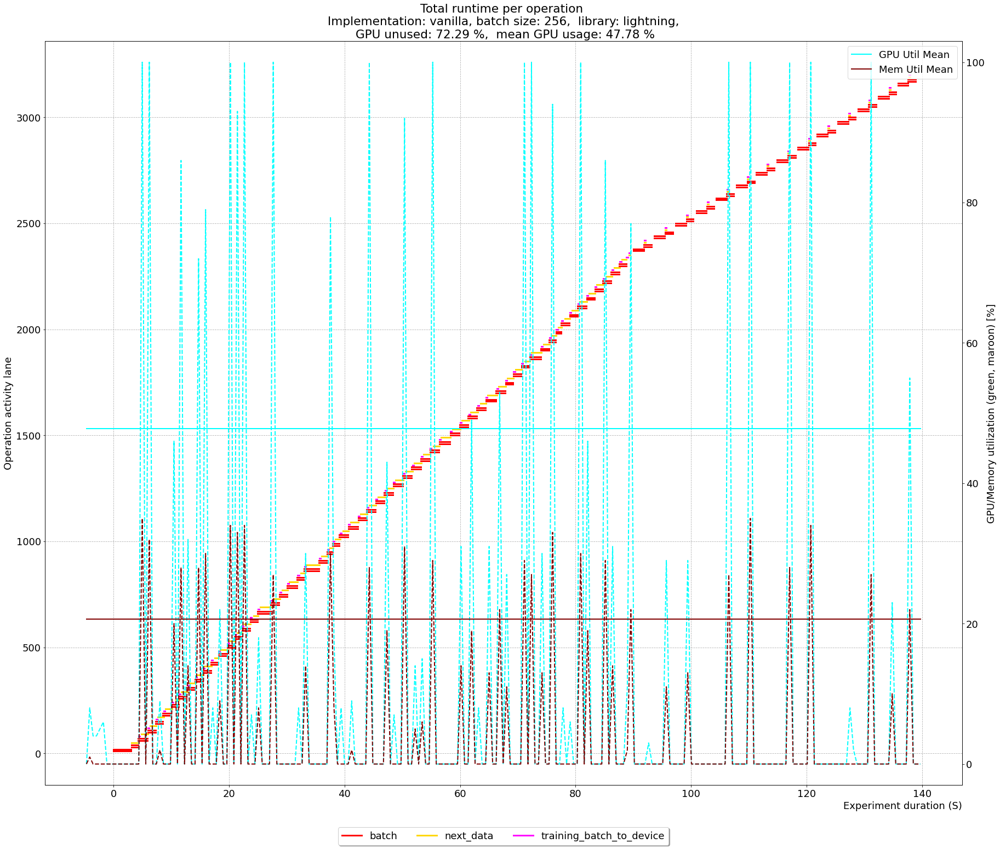

73.12285714285714 44.34925373134328


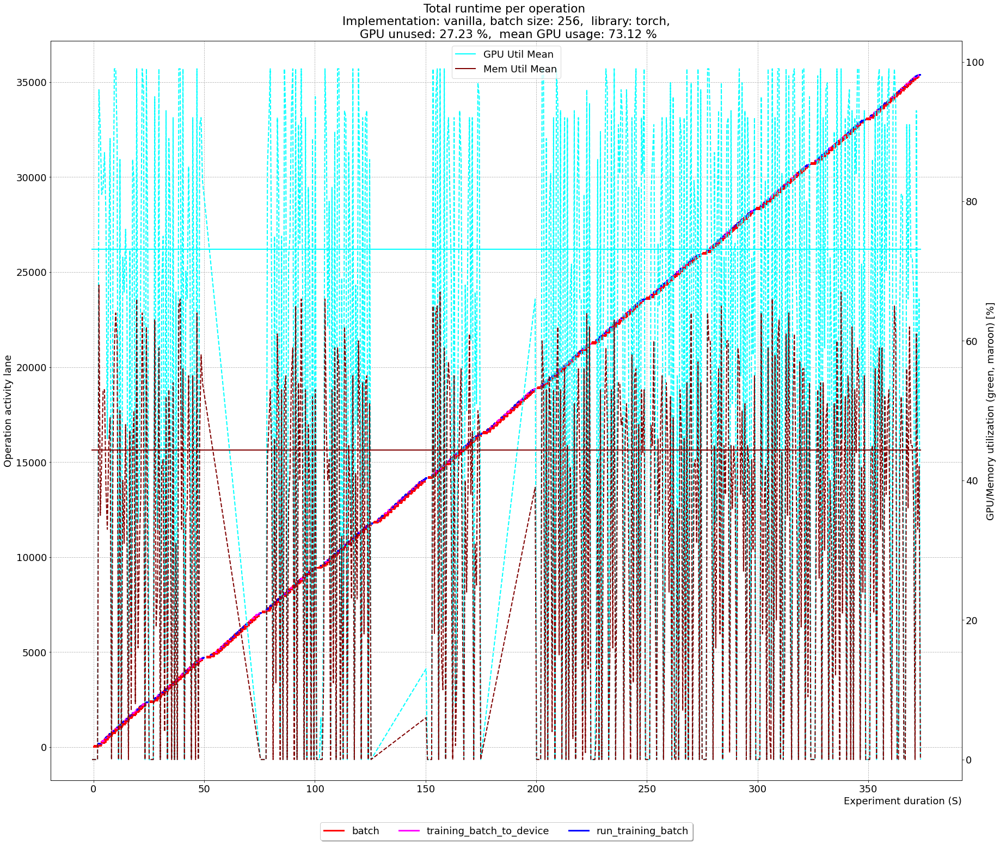

In [12]:
returns_scratch = []
for run in sorted(unique_runs_scratch):
    df = df_dataloader_scratch[df_dataloader_scratch["run"]==run]
    dfgpu = df_gpuutil_scratch[df_gpuutil_scratch["run"]==run]
    returns_scratch.append(show_timelines_with_gpu(df, dfgpu, lanes, colors, run, False, True, False, 2))

### Result tables

The following two tables display throughput details for both experiments. The default sample size, i.e. number of dataset items is 3000.

In [13]:
samples = 15000

In [14]:
# S3
results_s3 = pd.DataFrame.from_records(data=returns_s3)
results_s3["throughput"] = samples / results_s3["runtime"]
results_s3.sort_values(["runtime", "library"], ascending=True)

,runtime,gpu_util_zero,gpu_util_mean_no_zeros,mem_util_mean,mem_util_mean_no_zeros,implementation,cache,library,throughput
5,248.888043,82.038835,43.270270,2.597087,20.980392,threaded,1,lightning,60.268062
1,288.895206,83.944954,49.442857,2.699541,21.796296,asyncio,1,lightning,51.921942
0,769.255706,61.175337,65.238213,14.190751,39.071618,threaded,1,torch,19.499368
2,784.250707,61.088546,63.148225,14.316003,39.961451,asyncio,1,torch,19.126537
3,2218.206062,98.129252,54.515152,0.325964,22.549020,vanilla,1,lightning,6.762221
4,7527.883902,96.077205,67.107062,1.451613,39.334140,vanilla,1,torch,1.992592


In [15]:
# Scratch
results_scratch = pd.DataFrame.from_records(data=returns_scratch)
results_scratch["throughput"] = samples / results_scratch["runtime"]
results_scratch.sort_values(["runtime", "library"], ascending=True)

,runtime,gpu_util_zero,gpu_util_mean_no_zeros,mem_util_mean,mem_util_mean_no_zeros,implementation,cache,library,throughput
0,56.081477,41.489362,59.854545,11.840426,24.195652,threaded,1,lightning,267.467990
2,69.084791,47.663551,55.125000,9.588785,23.318182,asyncio,1,lightning,217.124488
4,138.876887,72.294372,47.781250,4.376623,20.632653,vanilla,1,lightning,108.009334
1,259.540014,8.333333,80.130303,41.786111,45.584848,threaded,1,torch,57.794557
3,276.510386,16.091954,82.865753,38.121839,45.683196,asyncio,1,torch,54.247510
5,373.150876,27.234927,73.122857,30.887734,44.349254,vanilla,1,torch,40.198217


### Forced violins

#### S3

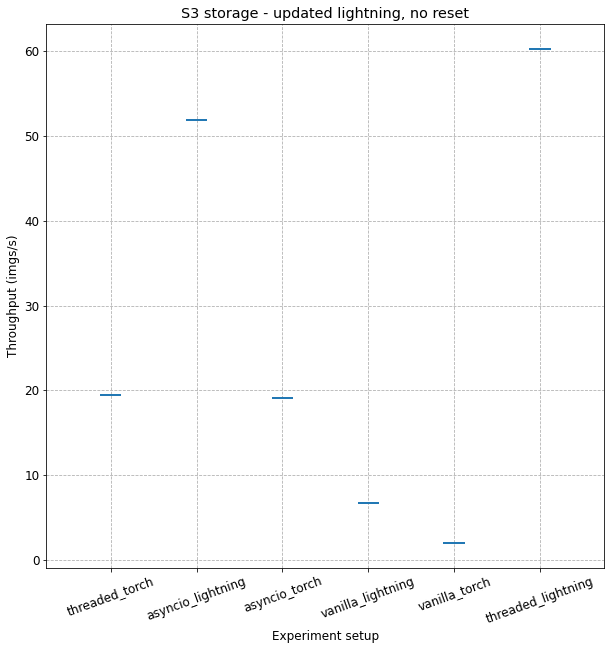

In [18]:
# since the experiment was not repeated, there is not array of values to plot in violin
# so here is a not-so-clever workaround 

df = pd.DataFrame()
def add_stats(row):
    line = [row["throughput"]] * 3
    line.append(0.0)
    line.append(0.0)
    new_row = pd.DataFrame([pd.Series(line)], index = [row["implementation"] + "_" + row["library"]])
    return df.append(new_row)

# add to df
for index, row in results_s3.iterrows():
    df = add_stats(row)

# give names
df.columns = [0, 1, "mean", "std_dev", "var"]
plot_violins(df, "S3 storage - updated lightning, no reset") # 

#### Scratch

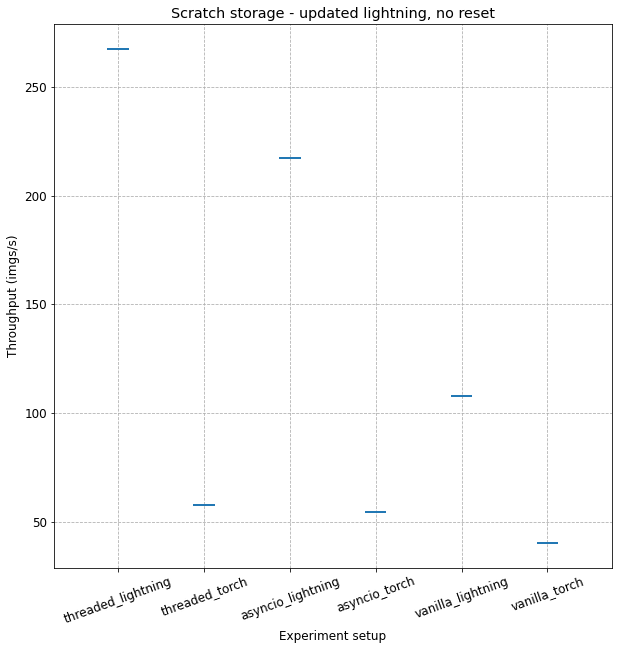

In [17]:
# add to df
df = pd.DataFrame() 
for index, row in results_scratch.iterrows():
    df = add_stats(row)

# give names
df.columns = [0, 1, "mean", "std_dev", "var"]
plot_violins(df, "Scratch storage - updated lightning, no reset") # 